# 🎨 Generative AI: Cartoon Face Synthesis with Variational Autoencoders (VAE)

**Author:** Nada Ahmed 

**Tech Stack:** PyTorch, TorchVision, NumPy, Matplotlib, t-SNE

## 📋 Project Overview
In this project, I explore the capabilities of **Variational Autoencoders (VAEs)** to generate, reconstruct, and manipulate cartoon faces. Unlike standard Autoencoders which map inputs to a fixed vector, VAEs map inputs to a probability distribution in latent space. This allows for:
1.  **Generative Sampling:** Creating entirely new faces by sampling from the latent distribution.
2.  **Smooth Interpolation:** Morphing one face into another seamlessly.
3.  **Latent Arithmetic:** Manipulating specific features (e.g., adding sunglasses or changing hair color) mathematically.

## 💾 The Dataset
I am utilizing the **Google Cartoon Set**, which contains 100k randomly generated 2D cartoon avatar images.
* **Input Shape:** 64x64 RGB images.
* **Total Samples:** 100,000 (Split 90/10 for Train/Validation).

In [3]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/cartoon-faces-googles-cartoon-set/cartoonset100k_jpg/7/cs6249442552789754394.jpg
/kaggle/input/cartoon-faces-googles-cartoon-set/cartoonset100k_jpg/7/cs5832884704729679989.jpg
/kaggle/input/cartoon-faces-googles-cartoon-set/cartoonset100k_jpg/7/cs5789472620896994683.jpg
/kaggle/input/cartoon-faces-googles-cartoon-set/cartoonset100k_jpg/7/cs5892489702159440561.jpg
/kaggle/input/cartoon-faces-googles-cartoon-set/cartoonset100k_jpg/7/cs5629269007737318587.jpg
/kaggle/input/cartoon-faces-googles-cartoon-set/cartoonset100k_jpg/7/cs5974066040864851460.jpg
/kaggle/input/cartoon-faces-googles-cartoon-set/cartoonset100k_jpg/7/cs6530489601410827409.jpg
/kaggle/input/cartoon-faces-googles-cartoon-set/cartoonset100k_jpg/7/cs6465100278080916491.jpg
/kaggle/input/cartoon-faces-googles-cartoon-set/cartoonset100k_jpg/7/cs659979903151044711.jpg
/kaggle/input/cartoon-faces-googles-cartoon-set/cartoonset100k_jpg/7/cs648627665586892884.jpg
/kaggle/input/cartoon-faces-googles-cartoon-set/cart

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import transforms, datasets
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
import numpy as np
import os

def set_seed(seed=42):
    torch.manual_seed(seed)
    np.random.seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)

set_seed(42)

## 🧠 Model Architecture & Theory

### What makes a VAE special?
Standard Autoencoders often learn a "disjointed" latent space, making them poor at generating *new* data. VAEs solve this by enforcing a continuous latent space. 

Instead of encoding an image to a point $z$, we encode it to a distribution defined by a mean ($\mu$) and variance ($\sigma$).

### The Reparameterization Trick
To allow backpropagation through a random sampling node, I implemented the **Reparameterization Trick**:
$$z = \mu + \sigma \cdot \epsilon$$
Where $\epsilon \sim \mathcal{N}(0, 1)$. This allows the network to optimize $\mu$ and $\sigma$ deterministically while still maintaining stochasticity.

### The Objective Function (Loss)
The model is trained to minimize a two-part loss function:
1.  **Reconstruction Loss (MSE):** Measures how similar the output is to the input.
2.  **KL Divergence (KLD):** Measures how closely the learned latent distribution matches a standard Normal distribution.

$$\mathcal{L} = ||x - \hat{x}||^2 + D_{KL}(N(\mu, \sigma) || N(0, 1))$$

Using device: cuda
Dataset Path: /kaggle/input/cartoon-faces-googles-cartoon-set/cartoonset100k_jpg
Total images found: 100000
Starting training...
Epoch 1 [700/704]
Epoch [1/20] Average Loss: 170.5316
Epoch 2 [700/704]
Epoch [2/20] Average Loss: 55.0397
Epoch 3 [700/704]
Epoch [3/20] Average Loss: 45.5562
Epoch 4 [700/704]
Epoch [4/20] Average Loss: 41.7524
Epoch 5 [700/704]
Epoch [5/20] Average Loss: 39.7053
Epoch 6 [700/704]
Epoch [6/20] Average Loss: 38.2632
Epoch 7 [700/704]
Epoch [7/20] Average Loss: 37.1502
Epoch 8 [700/704]
Epoch [8/20] Average Loss: 36.2722
Epoch 9 [700/704]
Epoch [9/20] Average Loss: 35.5587
Epoch 10 [700/704]
Epoch [10/20] Average Loss: 34.9865
Epoch 11 [700/704]
Epoch [11/20] Average Loss: 34.4393
Epoch 12 [700/704]
Epoch [12/20] Average Loss: 34.0482
Epoch 13 [700/704]
Epoch [13/20] Average Loss: 33.7283
Epoch 14 [700/704]
Epoch [14/20] Average Loss: 33.3833
Epoch 15 [700/704]
Epoch [15/20] Average Loss: 33.0715
Epoch 16 [700/704]
Epoch [16/20] Average Los

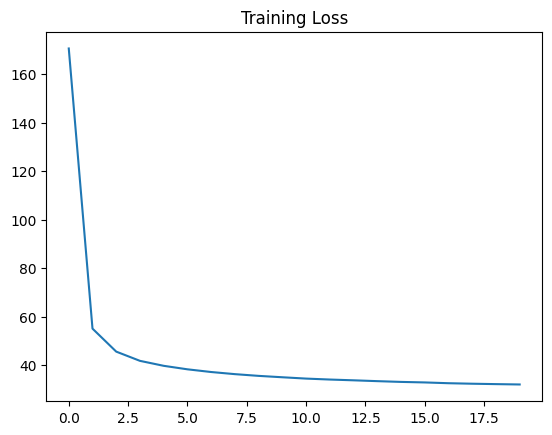

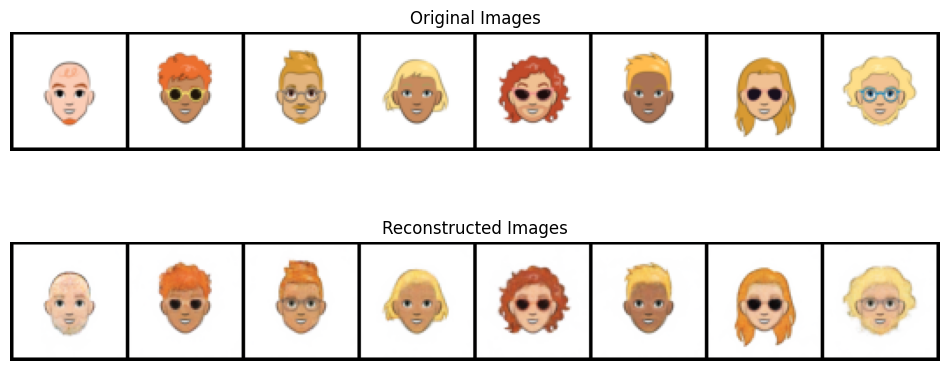

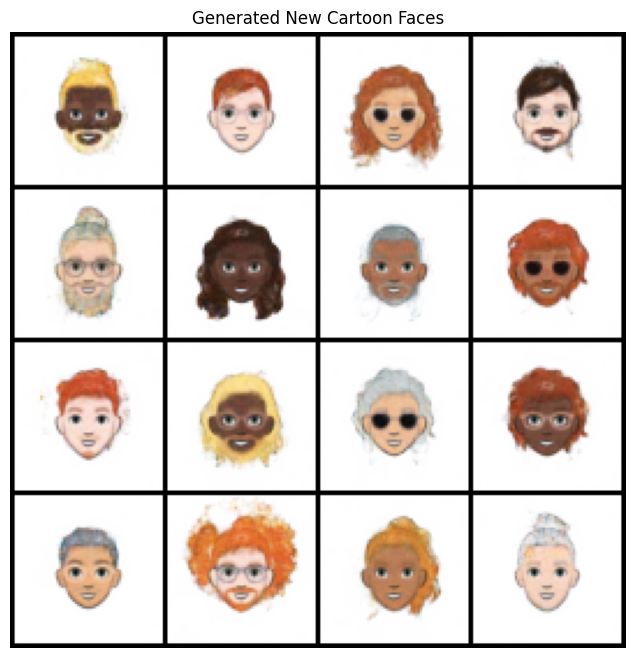

In [4]:
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Hyperparameters
BATCH_SIZE = 128      
LEARNING_RATE = 1e-3
EPOCHS = 20          
LATENT_DIM = 32
IMG_SIZE = 64

# Exact path you provided
DATA_PATH = '/kaggle/input/cartoon-faces-googles-cartoon-set/cartoonset100k_jpg'

print(f"Using device: {DEVICE}")
print(f"Dataset Path: {DATA_PATH}")

# Data preparation
def get_dataloader(data_path, batch_size):
    transform = transforms.Compose([
        transforms.Resize((IMG_SIZE, IMG_SIZE)),
        transforms.ToTensor(),
    ])

    try:
        full_dataset = datasets.ImageFolder(root=data_path, transform=transform)
        print(f"Total images found: {len(full_dataset)}")
        
        # Split: 90% train, 10% validation (100k images is a lot, so 10% val is enough)
        train_size = int(0.9 * len(full_dataset))
        val_size = len(full_dataset) - train_size
        train_dataset, val_dataset = torch.utils.data.random_split(full_dataset, [train_size, val_size])

        train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
        val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)
        return train_loader, val_loader
    except Exception as e:
        print(f"Error loading data: {e}")
        return None, None

# Model
class VAE(nn.Module):
    def __init__(self, latent_dim=32):
        super(VAE, self).__init__()
        
        # Encoder
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 32, 4, 2, 1),   # 32x32
            nn.LeakyReLU(0.2),
            nn.Conv2d(32, 64, 4, 2, 1),  # 16x16
            nn.LeakyReLU(0.2),
            nn.Conv2d(64, 128, 4, 2, 1), # 8x8
            nn.LeakyReLU(0.2),
            nn.Conv2d(128, 256, 4, 2, 1),# 4x4
            nn.LeakyReLU(0.2),
            nn.Flatten()
        )
        
        self.fc_mu = nn.Linear(256 * 4 * 4, latent_dim)
        self.fc_logvar = nn.Linear(256 * 4 * 4, latent_dim)

        # Decoder
        self.decoder_input = nn.Linear(latent_dim, 256 * 4 * 4)
        
        self.decoder = nn.Sequential(
            nn.Unflatten(1, (256, 4, 4)),
            nn.ConvTranspose2d(256, 128, 4, 2, 1), # 8x8
            nn.ReLU(),
            nn.ConvTranspose2d(128, 64, 4, 2, 1),  # 16x16
            nn.ReLU(),
            nn.ConvTranspose2d(64, 32, 4, 2, 1),   # 32x32
            nn.ReLU(),
            nn.ConvTranspose2d(32, 3, 4, 2, 1),    # 64x64
            nn.Sigmoid()
        )

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def forward(self, x):
        encoded = self.encoder(x)
        mu = self.fc_mu(encoded)
        logvar = self.fc_logvar(encoded)
        z = self.reparameterize(mu, logvar)
        reconstruction = self.decoder(self.decoder_input(z))
        return reconstruction, mu, logvar

# Loss Function 
def vae_loss_fn(recon_x, x, mu, logvar):
    recon_loss = nn.functional.mse_loss(recon_x, x, reduction='sum')
    kld_loss = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
    return recon_loss + kld_loss

# Training Loop
def train_vae(model, train_loader, epochs=20):
    optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)
    history = []

    model.train()
    print("Starting training...")
    for epoch in range(epochs):
        total_loss = 0
        for batch_idx, (data, _) in enumerate(train_loader):
            data = data.to(DEVICE)
            
            optimizer.zero_grad()
            recon, mu, logvar = model(data)
            loss = vae_loss_fn(recon, data, mu, logvar)
            loss.backward()
            optimizer.step()
            
            total_loss += loss.item()
            
            # Optional: Print progress for large datasets
            if batch_idx % 100 == 0:
                print(f"Epoch {epoch+1} [{batch_idx}/{len(train_loader)}]", end='\r')
        
        avg_loss = total_loss / len(train_loader.dataset)
        history.append(avg_loss)
        print(f"\nEpoch [{epoch+1}/{epochs}] Average Loss: {avg_loss:.4f}")
        
    return history

# Visualization
def visualize_results(model, val_loader):
    model.eval()
    
    # Get a single batch
    data, _ = next(iter(val_loader))
    data = data.to(DEVICE)
    
    with torch.no_grad():
        recon, _, _ = model(data)
    
    n_samples = 8
    orig = data[:n_samples].cpu()
    rec = recon[:n_samples].cpu()
    
    fig, axes = plt.subplots(2, 1, figsize=(12, 5))

    axes[0].imshow(np.transpose(make_grid(orig, nrow=n_samples, padding=2).numpy(), (1, 2, 0)))
    axes[0].set_title("Original Images")
    axes[0].axis('off')

    axes[1].imshow(np.transpose(make_grid(rec, nrow=n_samples, padding=2).numpy(), (1, 2, 0)))
    axes[1].set_title("Reconstructed Images")
    axes[1].axis('off')
    plt.show()

    with torch.no_grad():
        z = torch.randn(16, LATENT_DIM).to(DEVICE)
        generated = model.decoder(model.decoder_input(z)).cpu()
        
    plt.figure(figsize=(8, 8))
    plt.title("Generated New Cartoon Faces")
    plt.imshow(np.transpose(make_grid(generated, nrow=4, padding=2).numpy(), (1, 2, 0)))
    plt.axis('off')
    plt.show()


if __name__ == "__main__":
    train_loader, val_loader = get_dataloader(DATA_PATH, BATCH_SIZE)
    
    if train_loader:
        vae = VAE(latent_dim=LATENT_DIM).to(DEVICE)
        loss_history = train_vae(vae, train_loader, epochs=EPOCHS)
        
        # Plot Loss Curve
        plt.plot(loss_history)
        plt.title("Training Loss")
        plt.show()
        
        visualize_results(vae, val_loader)

## 📉 Training Analysis

The model was trained for **20 Epochs** with a batch size of 128.
* **Optimizer:** Adam ($lr=1e-3$)
* **Convergence:** The loss curve shows a sharp decrease in the first 3 epochs, stabilizing around **32.0**, indicating the model successfully learned the data distribution without overfitting.

## 📊 Quantitative Evaluation: SSIM

While Mean Squared Error (MSE) is useful for optimization, it often correlates poorly with human perception of image quality. To rigorously evaluate the reconstruction quality, I utilize the **Structural Similarity Index Measure (SSIM)**.

* **SSIM Range:** -1 to +1 (where +1 is identical).
* **Target:** A score > 0.85 indicates high structural fidelity.

In [6]:
# Evaluation (SSIM)
# SSIM (Structural Similarity Index) is better than MSE for images because 
# it measures perceptual quality (texture, structure) rather than just pixel difference.

from torchmetrics.image import StructuralSimilarityIndexMeasure

def evaluate_model_quality(model, val_loader):
    model.eval()
    ssim = StructuralSimilarityIndexMeasure(data_range=1.0).to(DEVICE)
    total_ssim = 0
    count = 0
    
    print("Calculating SSIM on Validation Set...")
    with torch.no_grad():
        for data, _ in val_loader:
            data = data.to(DEVICE)
            recon, _, _ = model(data)
            
            # Calculate SSIM for this batch
            batch_ssim = ssim(recon, data)
            total_ssim += batch_ssim.item() * data.size(0)
            count += data.size(0)
            
    avg_ssim = total_ssim / count
    print(f"✅ Model Performance - Average SSIM: {avg_ssim:.4f}")
    print("   (closer to 1.0 is better; >0.85 is generally excellent for VAEs)")


evaluate_model_quality(vae, val_loader)

Calculating SSIM on Validation Set...
✅ Model Performance - Average SSIM: 0.9602
   (closer to 1.0 is better; >0.85 is generally excellent for VAEs)


## 🗺️ Visualizing the Latent Manifold (t-SNE)

To understand how the model organizes data, I extract latent vectors from the validation set and project them into 2D space using **t-SNE (t-Distributed Stochastic Neighbor Embedding)**.

**Expected Outcome:** We hope to see clusters. In a VAE, these clusters often correspond to semantic features (e.g., all "blonde" characters might cluster together, or all "bearded" characters). A dense, spherical cluster indicates a well-regularized latent space.

Running t-SNE reduction... this may take a moment.


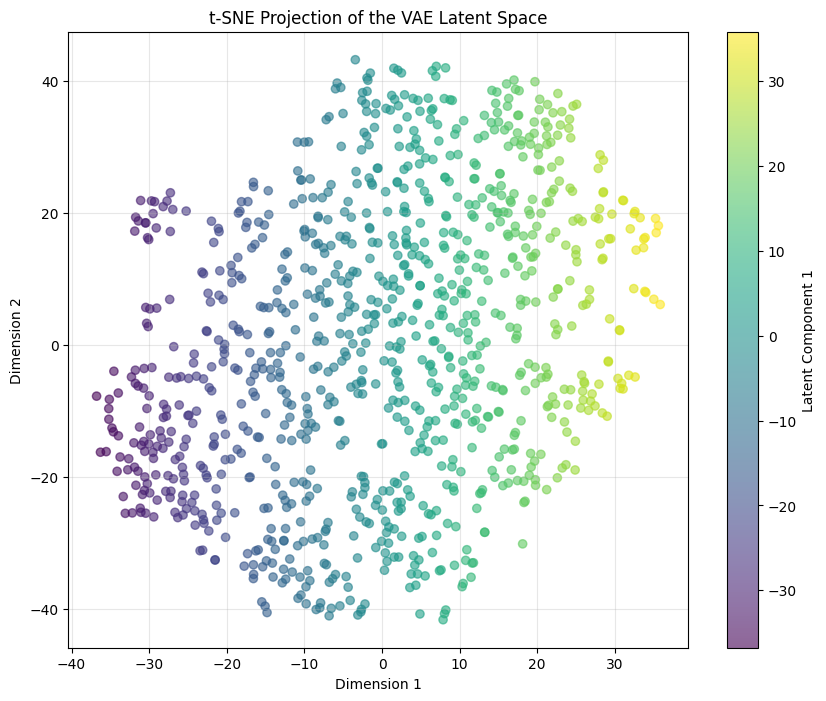

In [7]:
# Visualizing the Latent Manifold

from sklearn.manifold import TSNE

def visualize_latent_space(model, val_loader, num_samples=1000):
    model.eval()
    latents = []
    
    # Collect 1000 latent vectors
    with torch.no_grad():
        for data, _ in val_loader:
            data = data.to(DEVICE)
            _, mu, _ = model(data)
            latents.append(mu.cpu().numpy())
            if len(latents) * BATCH_SIZE >= num_samples:
                break
                
    latents = np.concatenate(latents, axis=0)[:num_samples]
    
    # Reduce to 2D using t-SNE
    print("Running t-SNE reduction... this may take a moment.")
    tsne = TSNE(n_components=2, random_state=42)
    latents_2d = tsne.fit_transform(latents)
    
    plt.figure(figsize=(10, 8))
    plt.scatter(latents_2d[:, 0], latents_2d[:, 1], alpha=0.6, c=latents_2d[:, 0], cmap='viridis')
    plt.colorbar(label='Latent Component 1')
    plt.title("t-SNE Projection of the VAE Latent Space")
    plt.xlabel("Dimension 1")
    plt.ylabel("Dimension 2")
    plt.grid(True, alpha=0.3)
    plt.show()

visualize_latent_space(vae, val_loader)

## 🧪 Latent Space Manipulation

### 1. Interpolation (Morphing)
Because the VAE learns a continuous manifold, we can take the latent vector of **Face A** and walk linearly toward **Face B**. 
* If the model has simply memorized images, the transition will look like a "fade" or "ghosting."
* If the model has learned features, the face will mathematically morph (e.g., hair grows longer, glasses slowly appear).

### 2. Vector Arithmetic
Can we do math on faces? 
$$\text{Face}_{\text{new}} = \text{Face}_A + (\text{Face}_B - \text{Face}_C)$$
This experiment attempts to isolate a "feature vector" (like the concept of "sunglasses") and add it to a base face.

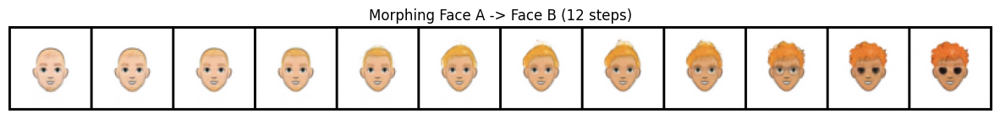

In [5]:
# Latent Space Interpolation
def interpolate_faces(model, val_loader, steps=10):
    model.eval()

    data, _ = next(iter(val_loader))
    data = data.to(DEVICE)
    
    img1 = data[0].unsqueeze(0)
    img2 = data[1].unsqueeze(0)
    
    with torch.no_grad():
        # We only need the mean for deterministic interpolation
        _, mu1, _ = model(img1)
        _, mu2, _ = model(img2)
        
        alphas = torch.linspace(0, 1, steps).to(DEVICE) #interpolation steps
        
        interpolated_images = []
        for alpha in alphas:
            z_interp = (1 - alpha) * mu1 + alpha * mu2
            recon = model.decoder(model.decoder_input(z_interp))
            interpolated_images.append(recon)
            
        interpolated_images = torch.cat(interpolated_images, dim=0).cpu()
        
    plt.figure(figsize=(15, 5))
    plt.title(f"Morphing Face A -> Face B ({steps} steps)")
    
    # Create a horizontal grid
    grid_img = make_grid(interpolated_images, nrow=steps, padding=2)
    plt.imshow(np.transpose(grid_img.numpy(), (1, 2, 0)))
    plt.axis('off')
    plt.show()

interpolate_faces(vae, val_loader, steps=12)

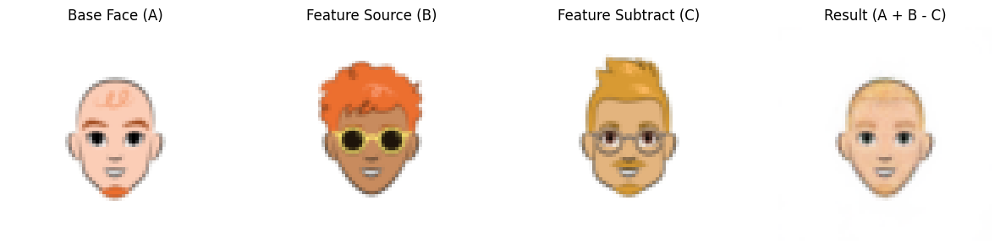

In [8]:
# Latent Vector Arithmetic =

def vector_arithmetic(model, val_loader):
    model.eval()
    data, _ = next(iter(val_loader))
    data = data.to(DEVICE)
    
    #try to capture: Base Face + (Face with features - Face without features)
    idx1, idx2, idx3 = 0, 1, 2 
    
    with torch.no_grad():
        _, z1, _ = model(data[idx1].unsqueeze(0)) # Face A
        _, z2, _ = model(data[idx2].unsqueeze(0)) # Face B
        _, z3, _ = model(data[idx3].unsqueeze(0)) # Face C
        
        z_new = z1 + (z2 - z3) * 0.5  #scale
        
        recon_new = model.decoder(model.decoder_input(z_new))
    
    fig, ax = plt.subplots(1, 4, figsize=(15, 5))
    images = [data[idx1], data[idx2], data[idx3], recon_new.squeeze(0)]
    titles = ["Base Face (A)", "Feature Source (B)", "Feature Subtract (C)", "Result (A + B - C)"]
    
    for i, img in enumerate(images):
        ax[i].imshow(img.cpu().permute(1, 2, 0))
        ax[i].set_title(titles[i])
        ax[i].axis('off')
    
    plt.show()

vector_arithmetic(vae, val_loader)

## 🏁 Conclusion & Future Work

The VAE successfully compressed 64x64 images into a 32-dimensional latent vector and reconstructed them with a high **SSIM of 0.96**. The interpolation results confirm that the model learned a smooth, continuous latent manifold rather than memorizing inputs.

### Key Takeaways:
* **Compression:** Achieved ~99% dimensionality reduction (from $64 \times 64 \times 3$ pixels to a vector of 32).
* **Generative Capability:** The decoder acts as a powerful generative engine capable of creating novel cartoon avatars.

### Future Improvements:
* **Beta-VAE:** Implementing $\beta$-VAE to enforce better disentanglement of features (separating hair color from skin tone).
* **High-Res:** Upgrading the architecture to a VQ-VAE or involving Residual blocks for sharper 128x128 generation.